### Experiment: Embedding using spatial feature-generated obs


In [2]:
from cellama import lm_cell_reference_celltyping,lm_cell_embed , lm_cell_integrated_embed

In [3]:
import scanpy as sc
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [4]:
import squidpy as sq

In [5]:
adata_lungca = sc.read_mtx('lungca_tumor.mtx', dtype='float32')
genename = pd.read_csv('lungca_tumor_genes.csv', names=['num','genes'], header=0)
cellmeta = pd.read_csv('lungca_tumor_metafile.csv')
adata_lungca.obs = cellmeta
df_tmp = genename.iloc[:,1].to_frame()
df_tmp.index = df_tmp.genes
adata_lungca.var = df_tmp

In [6]:
adata_lungca.obs.head()

,Unnamed: 0,Barcode,Sample,Sample_Origin,Cell_type,Cell_type.refined,Cell_subtype
0,AAACCTGAGTTGCAGG_LUNG_T06,AAACCTGAGTTGCAGG,LUNG_T06,tLung,Myeloid cells,Myeloid cells,mo-Mac
1,AAAGCAAGTAATTGGA_LUNG_T06,AAAGCAAGTAATTGGA,LUNG_T06,tLung,Myeloid cells,Myeloid cells,mo-Mac
2,AAATGCCCATTACGAC_LUNG_T06,AAATGCCCATTACGAC,LUNG_T06,tLung,Myeloid cells,Myeloid cells,mo-Mac
3,AACGTTGTCTTGTCAT_LUNG_T06,AACGTTGTCTTGTCAT,LUNG_T06,tLung,Myeloid cells,Myeloid cells,mo-Mac
4,AACTCAGAGGCTCATT_LUNG_T06,AACTCAGAGGCTCATT,LUNG_T06,tLung,Myeloid cells,Myeloid cells,mo-Mac


### Load Xenium Data

In [7]:
adata_xe = sc.read_10x_h5(
    filename="./xenium_output/cell_feature_matrix/cell_feature_matrix.h5"
)

In [8]:
df = pd.read_csv(
    "./xenium_output/cells.csv.gz"
)
df.set_index(adata_xe.obs_names, inplace=True)
adata_xe.obs = df.copy()

In [9]:
adata_xe.obsm["spatial"] = adata_xe.obs[["x_centroid", "y_centroid"]].copy().to_numpy()


In [10]:
sc.pp.filter_cells(adata_xe, min_counts=10)
sc.pp.filter_genes(adata_xe, min_cells=5)


### Cell Annotation - using CELLama

In [11]:
adata_xe_ = lm_cell_reference_celltyping(adata_lungca, adata_xe, top_k=20, use_intersect= True, 
                                         ref_cell = 'Cell_type', new_name='CellType_LM')

Language Model Cell Embedding Is Implemented


/home/user/anaconda3/envs/lang/lib/python3.9/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/home/user/DATA1/Data/Xenium_lungcancer_10xdata/cellama.py:77: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  nearest_cell_types = [cell_types[i[0]] for i in indices]


/home/user/anaconda3/envs/lang/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


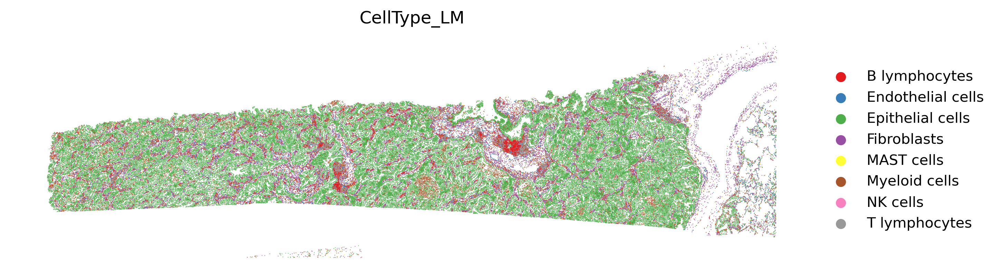

In [12]:
fig, ax = plt.subplots(figsize=(10, 10), dpi=300)
sc.pl.spatial(adata_xe_, color= ['CellType_LM'], img_key=None, spot_size=10,frameon=False,ax=ax,
             palette='Set1')

### Generate Spatial Features to CELLama Embedding - Niche Analysis

In [13]:
from cellama_st.niche_analysis import find_and_order_neighbors, calculate_nichecells_summary

In [14]:
#Add cell obs to top5 nearest cells for each cell
adata_xe_ = find_and_order_neighbors(adata_xe_, cellname='CellType_LM',radius=None, n_neighs=5)

Niche cells : 0/154472 for calculation
Niche cells : 10000/154472 for calculation
Niche cells : 20000/154472 for calculation
Niche cells : 30000/154472 for calculation
Niche cells : 40000/154472 for calculation
Niche cells : 50000/154472 for calculation
Niche cells : 60000/154472 for calculation
Niche cells : 70000/154472 for calculation
Niche cells : 80000/154472 for calculation
Niche cells : 90000/154472 for calculation
Niche cells : 100000/154472 for calculation
Niche cells : 110000/154472 for calculation
Niche cells : 120000/154472 for calculation
Niche cells : 130000/154472 for calculation
Niche cells : 140000/154472 for calculation
Niche cells : 150000/154472 for calculation


In [15]:
print(adata_xe_.obs['nearest_cells'][0])

Myeloid cells,Epithelial cells,Epithelial cells,Epithelial cells,T lymphocytes


/tmp/ipykernel_1732676/3949810848.py:1: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print(adata_xe_.obs['nearest_cells'][0])


In [16]:
#Embedding using cellama, including information for 'nearest cells'
adata_emb_st=  lm_cell_embed(adata_xe_, top_k=16, model_name="all-MiniLM-L12-v2",
                          gene_list=None, obs_features= ['nearest_cells'],
                         return_sentence=True)

/home/user/DATA1/Data/Xenium_lungcancer_10xdata/cellama.py:97: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata_emb = sc.AnnData(emb_res)


/home/user/anaconda3/envs/lang/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/user/anaconda3/envs/lang/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


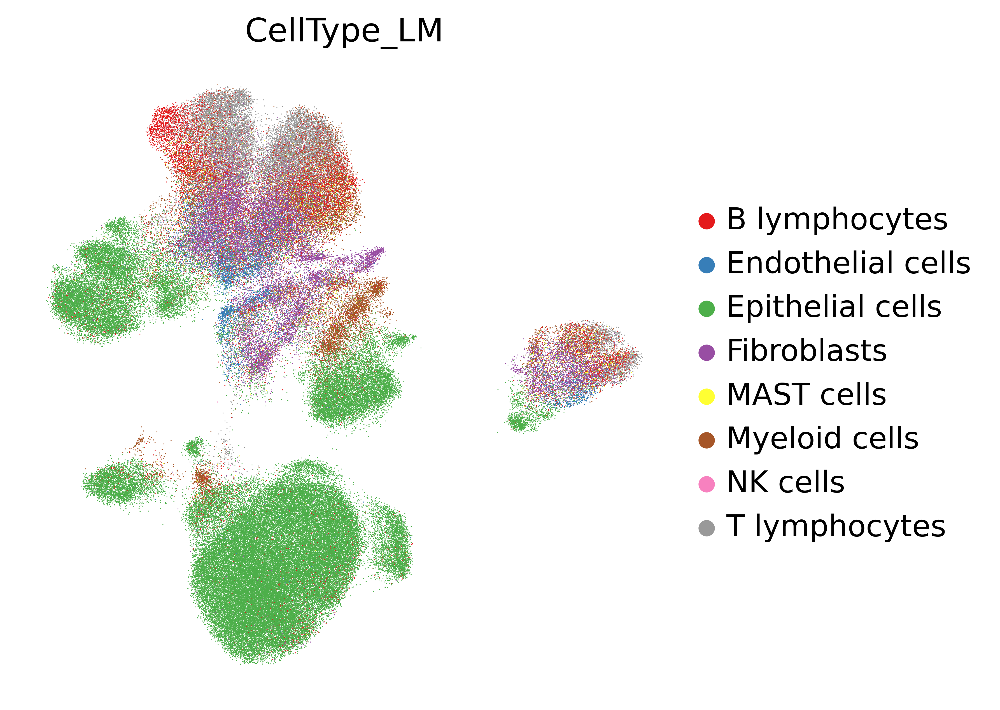

In [17]:
sc.set_figure_params(figsize=(5, 5), dpi=300)
sc.pl.umap(adata_emb_st,   #[adata_emb_sp.obs['CellType_LM']=='T lymphocytes'], 
           color=['CellType_LM'], 
           frameon=False, 
           wspace=0.6, 
           palette = 'Set1',
           title=['CellType_LM'],
          save='st_niche_umap.png')

In [18]:
adata_xe_.obsm['X_cellama_sp']= adata_emb_st.X

#### Niche Analysis using CELLama Embedded Results - Fibroblasts Subset
- subset fibroblasts and cluster then according to embedded results considering top5 nearest cells for each cell. 

In [19]:
#Niche ANalysis for Fibroblasts
adata_xe_fb = adata_xe_[adata_xe_.obs['CellType_LM']=='Fibroblasts']


In [20]:
sc.pp.neighbors(adata_xe_fb, n_neighbors=20,use_rep = 'X_cellama_sp')
sc.tl.leiden(
    adata_xe_fb,
    resolution=0.4,
)

In [21]:
sc.tl.umap(adata_xe_fb)


/home/user/anaconda3/envs/lang/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/user/anaconda3/envs/lang/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/user/anaconda3/envs/lang/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map)

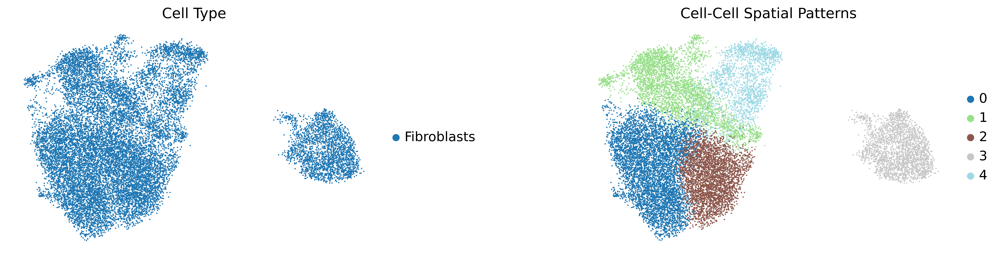

In [23]:
sc.set_figure_params(figsize=(6, 4), dpi=300)
sc.pl.umap(adata_xe_fb, 
           color=['CellType_LM','leiden'], 
           frameon=False, 
           wspace=0.4, 
           palette = 'tab20',
           title=["Cell Type", "Cell-Cell Spatial Patterns"],
          save='st_niche_fibroblasts.png')

/home/user/anaconda3/envs/lang/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


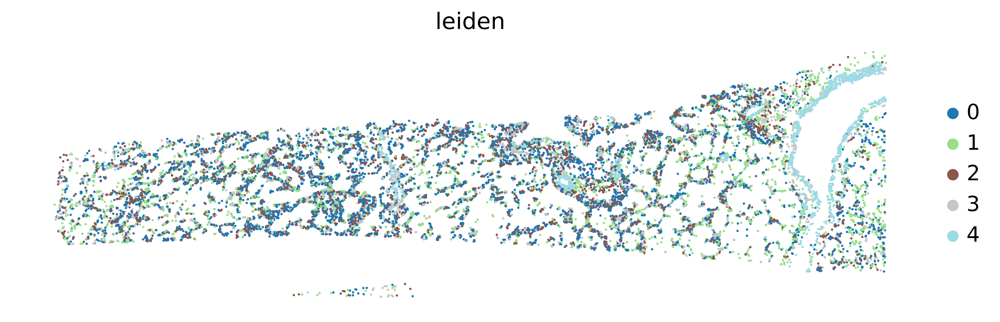

In [24]:
fig, ax = plt.subplots(figsize=(10, 10), dpi=300)
sc.pl.spatial(adata_xe_fb, color= ['leiden'], img_key=None, spot_size=30,frameon=False,ax=ax,
             palette='tab20',
             save='st_niche_fibroblasts_niche.png')

In [25]:
summary_nichecells = calculate_nichecells_summary(adata_xe_fb, 'leiden', top_number=None)

Text(0.5, 77.1666666666667, 'Clusters')

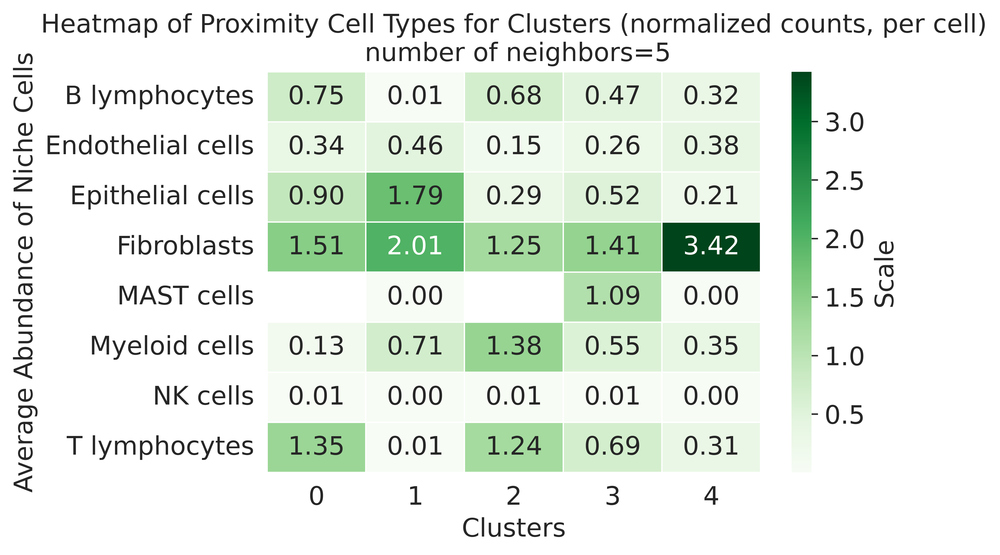

In [28]:
sns.set_style("whitegrid", {'axes.grid' : False})
sns.heatmap(summary_nichecells, annot=True, fmt=".2f", linewidths=.5, cmap='Greens', cbar_kws={'label': 'Scale'})

# Add titles and labels as necessary
plt.title('Heatmap of Proximity Cell Types for Clusters (normalized counts, per cell)\n number of neighbors=5')
plt.ylabel('Average Abundance of Niche Cells')
plt.xlabel('Clusters')

#### DEGs for niche cells clustered by CELLama results

/home/user/anaconda3/envs/lang/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


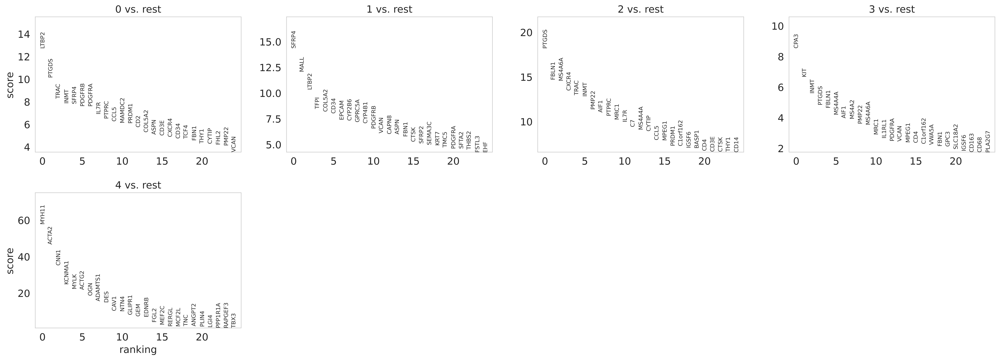

In [29]:
sc.tl.rank_genes_groups(adata_xe_fb, "leiden", method="wilcoxon")
sc.pl.rank_genes_groups(adata_xe_fb,values_to_plot="logfoldchanges",
    min_logfoldchange=3,
    vmax=7,
    vmin=-7,
    cmap="bwr", n_genes=25, sharey=False)


         Falling back to preprocessing with `sc.pp.pca` and default params.


/home/user/anaconda3/envs/lang/lib/python3.9/site-packages/scanpy/get/get.py:69: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  d = d.stack(level=1).reset_index()
/home/user/anaconda3/envs/lang/lib/python3.9/site-packages/scanpy/get/get.py:69: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  d = d.stack(level=1).reset_index()
/home/user/anaconda3/envs/lang/lib/python3.9/site-packages/scanpy/get/get.py:69: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details.

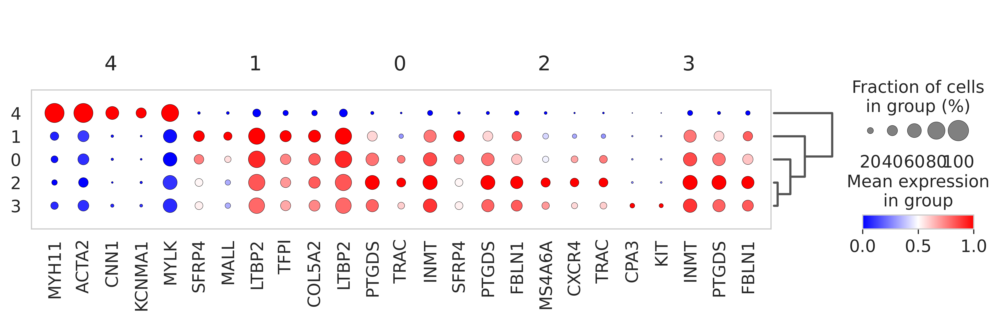

In [30]:
sc.pl.rank_genes_groups_dotplot(
    adata_xe_fb, groupby="leiden", standard_scale="var", n_genes=5,cmap="bwr",
)